In [1]:
!pip install -q roboflow
!pip install -q ultralytics

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="")
project = rf.workspace("carsightv2").project("damagedetection-klhmy")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to DamageDetection-1 in yolov8:: 100%|██████████| 18600/18600 [00:03<00:00, 6157.23it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from ultralytics import YOLO
import yaml
import os
import shutil
from sklearn.model_selection import train_test_split
import torch

In [4]:
base_dir = '/kaggle/working/DamageDetection-1'
images_dir = os.path.join(base_dir, "train/images")
labels_dir = os.path.join(base_dir, "train/labels")
new_base_dir = os.path.join('', "dataset")

# Create the new directory structure
new_train_images_dir = os.path.join(new_base_dir, "train/images")
new_train_labels_dir = os.path.join(new_base_dir, "train/labels")
new_val_images_dir = os.path.join(new_base_dir, "valid/images")
new_val_labels_dir = os.path.join(new_base_dir, "valid/labels")
new_test_images_dir = os.path.join(new_base_dir, "test/images")
new_test_labels_dir = os.path.join(new_base_dir, "test/labels")

for path in [new_train_images_dir, new_train_labels_dir, new_val_images_dir, new_val_labels_dir, new_test_images_dir, new_test_labels_dir]:
    os.makedirs(path, exist_ok=True)

# Get all image and label files
image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
label_files = [f.replace('.jpg', '.txt').replace('.png', '.txt') for f in image_files]

# Split into train, validation, and test sets (e.g., 70% train, 15% val, 15% test)
train_images, test_images, train_labels, test_labels = train_test_split(image_files, label_files, test_size=0.3, random_state=42)
val_images, test_images, val_labels, test_labels = train_test_split(test_images, test_labels, test_size=0.5, random_state=42)

# Function to copy files to the respective folders
def copy_files(file_list, src_dir, dest_dir):
    for file_name in file_list:
        src_path = os.path.join(src_dir, file_name)
        dest_path = os.path.join(dest_dir, file_name)
        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)

# Copy files for train set
copy_files(train_images, images_dir, new_train_images_dir)
copy_files(train_labels, labels_dir, new_train_labels_dir)

# Copy files for validation set
copy_files(val_images, images_dir, new_val_images_dir)
copy_files(val_labels, labels_dir, new_val_labels_dir)

# Copy files for test set
copy_files(test_images, images_dir, new_test_images_dir)
copy_files(test_labels, labels_dir, new_test_labels_dir)

print("Dataset split successfully.")

Dataset split successfully.


In [5]:
yaml_path = '/kaggle/working/DamageDetection-1/data.yaml'
new_paths = {
    'train': '/kaggle/working/dataset/train/images',
    'val': '/kaggle/working/dataset/valid/images',
    'test': '/kaggle/working/dataset/test/images'
}

with open(yaml_path, 'r') as file:
    data = yaml.safe_load(file)
data.update(new_paths)
with open(yaml_path, 'w') as file:
    yaml.dump(data, file)

print("Paths updated successfully.")

Paths updated successfully.


In [7]:
model = YOLO('yolov8m-seg.yaml')
model.model.load_state_dict(model.model.state_dict(), strict=False)

print("Number of GPUs: ",torch.cuda.device_count())
print("Number of CPU Cores: ",os.cpu_count())
workers = os.cpu_count() * 2
print("Workers: ", workers)

Number of GPUs:  2
Number of CPU Cores:  4
Workers:  8


In [8]:
model.info()

YOLOv8m-seg summary: 331 layers, 27,285,968 parameters, 27,285,952 gradients, 110.6 GFLOPs


(331, 27285968, 27285952, 110.64632320000001)

In [9]:
result = model.train(
    data='/kaggle/working/DamageDetection-1/data.yaml',  # Path to YAML file
    epochs=100,                                        # Number of epochs
    batch=32,                                          # Total batch size
    imgsz=640,                                         # Image size
    device='0,1',                                      # GPUs to use (0 and 1)
    workers=4,                                         # Number of workers
    task='segment',                                    # Specify segmentation task
    name='/kaggle/working/DamageDetection-v8/',        # Experiment name
    patience=10                                        # Early stopping patience
)

Ultralytics 8.3.48 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.yaml, data=/kaggle/working/DamageDetection-1/data.yaml, epochs=100, time=None, patience=10, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0,1, workers=4, project=None, name=DamageDetection-v8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_f

100%|██████████| 755k/755k [00:00<00:00, 17.5MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 73.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/train/labels... 6507 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6507/6507 [00:07<00:00, 893.91it/s]


train: New cache created: /kaggle/working/dataset/train/labels.cache


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/valid/labels...:   0%|          | 0/1395 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/dataset/valid/labels... 1371 images, 0 backgrounds, 0 corrupt:  98%|█████████▊| 1371/1395 [00:01<00:00, 785.24it/s]/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/dataset/valid/labels... 1395 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1395/1395 [00:01<00:00, 854.16it/s]


val: New cache created: /kaggle/working/dataset/valid/labels.cache
Plotting labels to /kaggle/working/DamageDetection-v8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/DamageDetection-v8
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.37G       3.54      7.255      4.363      4.198         29        640: 100%|██████████| 204/204 [02:24<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.11it/s]


                   all       1395       3126    0.00206      0.235    0.00223   0.000739    0.00019     0.0216   0.000101   1.73e-05

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.31G      3.161      4.975      3.859      3.685         28        640: 100%|██████████| 204/204 [02:25<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.02it/s]


                   all       1395       3126      0.353     0.0283     0.0115    0.00322      0.352     0.0232    0.00632    0.00142

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.29G       2.52      4.573      3.384      2.925         26        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.414      0.106     0.0397     0.0133      0.415     0.0893     0.0329    0.00894

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.33G       2.23      4.166      3.017      2.556         21        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.05it/s]


                   all       1395       3126      0.453      0.142     0.0668     0.0235      0.446      0.123     0.0569     0.0172

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.33G      2.063      3.861       2.78       2.36         22        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.12it/s]


                   all       1395       3126      0.323      0.186       0.13     0.0522      0.353       0.18      0.128     0.0465

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.29G      1.971      3.686      2.633      2.261         25        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.12it/s]


                   all       1395       3126      0.503      0.169      0.119     0.0462      0.505      0.146        0.1     0.0339

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.37G      1.894      3.513      2.512      2.183         15        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.12it/s]


                   all       1395       3126      0.572      0.236      0.205     0.0923      0.569      0.229      0.189     0.0785

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.28G      1.846      3.387      2.421      2.129         27        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.09it/s]


                   all       1395       3126      0.337      0.239      0.206     0.0962      0.429      0.225      0.196     0.0811

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.29G      1.814      3.344       2.35      2.092         28        640: 100%|██████████| 204/204 [02:32<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:22<00:00,  1.98it/s]


                   all       1395       3126      0.426      0.263      0.246      0.116       0.45      0.245      0.232     0.0995

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100       8.3G      1.747      3.214      2.289      2.039         29        640: 100%|██████████| 204/204 [02:34<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.02it/s]


                   all       1395       3126      0.319      0.279      0.269      0.132      0.308      0.271      0.248      0.109

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.28G       1.74      3.151      2.218      2.021         29        640: 100%|██████████| 204/204 [02:34<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:22<00:00,  2.00it/s]


                   all       1395       3126       0.31       0.34      0.284      0.144      0.323      0.322      0.271      0.124

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.29G      1.721      3.102      2.177       1.99         37        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:22<00:00,  2.00it/s]


                   all       1395       3126      0.366       0.33      0.305      0.156      0.356      0.311      0.281      0.127

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.33G      1.672      3.018      2.119       1.96         34        640: 100%|██████████| 204/204 [02:34<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.00it/s]


                   all       1395       3126      0.369       0.36      0.319      0.164      0.361      0.342      0.296      0.135

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.27G      1.652      2.986      2.085      1.938         31        640: 100%|██████████| 204/204 [02:34<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.04it/s]


                   all       1395       3126      0.423      0.334      0.324      0.171      0.429      0.328      0.312      0.145

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.34G      1.618      2.927      2.013      1.897         42        640: 100%|██████████| 204/204 [02:26<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.13it/s]


                   all       1395       3126      0.456      0.391      0.385      0.207      0.456       0.38      0.364      0.172

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.25G      1.602      2.877      1.971      1.883         31        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.14it/s]


                   all       1395       3126      0.433      0.391      0.377      0.204      0.446       0.38      0.368      0.179

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.28G      1.581      2.822      1.925      1.859         35        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.14it/s]


                   all       1395       3126      0.484      0.377      0.392      0.215      0.485       0.37      0.375       0.18

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.31G      1.568      2.801      1.928      1.836         14        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.454      0.402      0.408      0.232      0.495      0.391      0.396      0.194

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.27G      1.541      2.734      1.866      1.825         31        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.14it/s]


                   all       1395       3126      0.464      0.431       0.43      0.241      0.467      0.418      0.413      0.204

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.29G      1.528      2.706      1.823      1.804         57        640: 100%|██████████| 204/204 [02:25<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.13it/s]


                   all       1395       3126      0.513      0.457      0.464      0.258      0.508       0.44      0.441      0.219

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.29G      1.501      2.659      1.784      1.783         30        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.14it/s]


                   all       1395       3126      0.492      0.454      0.458      0.259      0.486      0.442       0.44      0.219

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.25G       1.48      2.624      1.756      1.762         25        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.473      0.493      0.476      0.269      0.482       0.47      0.463      0.229

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.32G      1.474      2.599      1.725       1.75         21        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.504      0.466      0.479      0.276      0.504      0.452      0.458      0.234

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100       8.3G      1.464      2.577       1.69      1.743         29        640: 100%|██████████| 204/204 [02:24<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.511      0.498      0.496      0.282      0.498      0.484      0.468      0.233

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.25G      1.446      2.535      1.663      1.725         24        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.564      0.471      0.505       0.29      0.566      0.468      0.491      0.241

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.24G      1.423      2.488       1.63      1.704         28        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.539      0.508      0.523      0.305      0.543      0.491      0.506      0.257

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100       8.3G      1.419      2.482      1.593      1.702         42        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.572      0.515      0.538      0.319      0.562      0.505       0.52      0.268

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.24G      1.393       2.44      1.573      1.677         35        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126       0.56      0.516       0.53      0.308      0.566      0.512      0.521      0.268

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.26G      1.381      2.417      1.534      1.666         21        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.567      0.542      0.556      0.333      0.585      0.534      0.557      0.282

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.25G      1.371      2.413      1.512      1.649         21        640: 100%|██████████| 204/204 [02:28<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.615      0.543      0.572      0.346       0.62      0.529      0.562      0.292

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.28G      1.363       2.37      1.497      1.643         23        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.05it/s]


                   all       1395       3126      0.615       0.53      0.588      0.353      0.621       0.53      0.575      0.298

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.26G      1.337      2.353      1.468      1.618         37        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.609      0.565      0.602      0.371      0.599      0.554      0.584       0.31

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.29G      1.326      2.325      1.432      1.608         23        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.647      0.568      0.621      0.381      0.636      0.552      0.597      0.316

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.23G      1.312      2.304      1.406      1.596         35        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.681      0.563      0.628       0.39      0.667      0.555      0.604      0.324

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.25G      1.305      2.265      1.384      1.593         30        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.04it/s]


                   all       1395       3126      0.665      0.565      0.616      0.379      0.661       0.56      0.604      0.317

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.25G        1.3       2.26      1.357      1.581         22        640: 100%|██████████| 204/204 [02:31<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.665      0.582       0.64        0.4      0.678      0.568      0.631      0.335

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.19G      1.288      2.254      1.348      1.577         46        640: 100%|██████████| 204/204 [02:25<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.656      0.607      0.657      0.416      0.656      0.598       0.64      0.344

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.25G      1.255      2.206      1.311      1.545         38        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.705      0.608      0.665      0.423      0.691       0.59      0.644      0.348

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.25G      1.247      2.206      1.297      1.536         23        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.684      0.621      0.672      0.428      0.685      0.601      0.651       0.35

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.27G      1.236      2.174      1.262      1.527         16        640: 100%|██████████| 204/204 [02:25<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.703      0.596      0.673      0.438      0.712      0.591      0.667      0.362

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100       8.3G      1.239      2.163      1.265      1.528         44        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.727      0.632      0.696      0.447      0.726      0.627      0.678      0.366

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.25G      1.216      2.142      1.238      1.506         40        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.705       0.65      0.703      0.451      0.705      0.639      0.685      0.373

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.23G      1.221      2.138      1.234      1.507         25        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126       0.71      0.657      0.708       0.46      0.699      0.651      0.692      0.379

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.34G      1.192        2.1      1.186      1.477         20        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.759      0.655      0.732      0.477      0.741      0.652      0.713      0.394

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.25G      1.183      2.109      1.179      1.479         22        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.755      0.649      0.725      0.478      0.757      0.646      0.712      0.398

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100       8.3G      1.171      2.063      1.168      1.467         29        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.752      0.665      0.735      0.486      0.742      0.655      0.714        0.4

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.29G       1.16      2.034       1.15      1.458         33        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.803      0.646      0.741      0.494       0.79      0.644      0.723      0.407

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.29G      1.157       2.02      1.119      1.449         30        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.759      0.664      0.746      0.497      0.757      0.657      0.733      0.412

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.31G      1.137      2.012      1.105      1.432         30        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.756      0.698      0.762       0.51      0.749      0.689      0.738      0.423

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.27G      1.131      2.003      1.091      1.427         19        640: 100%|██████████| 204/204 [02:24<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.791      0.686      0.768      0.523      0.783      0.684      0.756      0.431

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.29G      1.128      2.002       1.08      1.427         33        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.08it/s]


                   all       1395       3126      0.797      0.702      0.777      0.525      0.795      0.701      0.765      0.438

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.22G      1.113       1.97      1.064      1.403         30        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.808      0.696      0.776      0.528      0.802      0.694      0.762      0.441

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.19G      1.104      1.951      1.043      1.403         21        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.804      0.706      0.783      0.537      0.801      0.706      0.773      0.446

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.21G       1.09      1.927      1.027      1.389         25        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.787      0.729      0.799      0.551      0.803       0.71      0.786      0.456

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.24G       1.09      1.897      1.033      1.389         33        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.08it/s]


                   all       1395       3126      0.801      0.725      0.798      0.548      0.803      0.721      0.785      0.454

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.23G      1.082       1.91      1.022      1.375         28        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.837      0.724      0.816      0.563      0.829      0.716      0.793      0.462

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.21G      1.074      1.876     0.9882      1.371         27        640: 100%|██████████| 204/204 [02:31<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.13it/s]


                   all       1395       3126      0.832      0.727      0.817      0.569      0.819      0.721       0.79      0.465

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.22G      1.062      1.864     0.9807      1.361         32        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.821      0.742      0.815       0.57      0.819       0.73      0.798      0.468

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.24G      1.059      1.875       0.98      1.367         26        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.829      0.767      0.823      0.578       0.82      0.751      0.802      0.473

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.22G      1.043      1.834     0.9649      1.348         23        640: 100%|██████████| 204/204 [02:28<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.819      0.767      0.832       0.59      0.814      0.767      0.816      0.481

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.21G      1.043      1.838     0.9592       1.35         21        640: 100%|██████████| 204/204 [02:28<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.16it/s]


                   all       1395       3126      0.848      0.756      0.824      0.587      0.844      0.744      0.806      0.479

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.94G      1.025      1.825     0.9351      1.329         27        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.20it/s]


                   all       1395       3126      0.858       0.74      0.827      0.587      0.846      0.731      0.807      0.479

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.27G      1.009      1.784     0.9211      1.324         23        640: 100%|██████████| 204/204 [02:27<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.842      0.772      0.843      0.604      0.836      0.763      0.819      0.493

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100       8.3G      1.001      1.765     0.8981      1.314         32        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.842      0.774      0.838      0.602      0.836      0.763      0.821      0.493

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.21G       1.01       1.75     0.9086      1.318         28        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.849      0.775      0.846      0.609      0.839      0.768      0.823      0.497

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.25G      1.011      1.799      0.906      1.318         34        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.853      0.785      0.853      0.615      0.844      0.779      0.833      0.501

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.24G     0.9861      1.756     0.8811        1.3         31        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.859      0.779      0.853      0.623      0.854      0.769      0.828      0.505

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.24G     0.9751      1.753     0.8716      1.287         33        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.867       0.78      0.856      0.625      0.867      0.772      0.837      0.507

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.21G     0.9698       1.73     0.8694      1.288         27        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126      0.865      0.786      0.858      0.627      0.873      0.773      0.842      0.514

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.25G     0.9674       1.72     0.8463      1.282         44        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126      0.883      0.782      0.861      0.632      0.864       0.78      0.841      0.518

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.23G     0.9455      1.686     0.8351      1.266         33        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126      0.877      0.792      0.862      0.633      0.869      0.791      0.847      0.516

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.25G     0.9583      1.707     0.8405      1.272         39        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.08it/s]


                   all       1395       3126      0.887      0.776      0.862      0.633      0.881      0.773      0.849       0.52

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100       8.2G      0.935      1.655     0.8159       1.26         32        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.894      0.786      0.863      0.638      0.893      0.779      0.852      0.521

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.22G     0.9362      1.686     0.8232      1.258         26        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126        0.9      0.793      0.871      0.644       0.89      0.784      0.854      0.528

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.32G     0.9328      1.658     0.8151      1.255         27        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.887      0.787      0.869      0.645      0.884      0.776      0.852      0.528

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.23G     0.9285      1.633     0.8037      1.256         39        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.09it/s]


                   all       1395       3126      0.882      0.802      0.871      0.648      0.875      0.793      0.856      0.529

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.25G      0.916      1.628      0.789      1.241         24        640: 100%|██████████| 204/204 [02:36<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.01it/s]


                   all       1395       3126      0.895      0.799      0.873      0.652      0.888      0.792      0.857      0.534

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100       8.2G     0.9109      1.636     0.7861      1.234         32        640: 100%|██████████| 204/204 [02:31<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.15it/s]


                   all       1395       3126      0.893      0.806      0.878      0.656      0.893      0.801      0.866      0.537

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.26G     0.9064      1.614     0.7816      1.239         33        640: 100%|██████████| 204/204 [02:28<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.896      0.804      0.877      0.657      0.899      0.799      0.866      0.537

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.28G        0.9      1.605     0.7707      1.223         28        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.17it/s]


                   all       1395       3126      0.897      0.816       0.88      0.662      0.898      0.802      0.862      0.539

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.28G     0.8923      1.598     0.7714      1.222         29        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.902      0.814      0.884      0.665      0.892      0.806      0.868       0.54

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.22G     0.8804      1.575     0.7458       1.21         33        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.21it/s]


                   all       1395       3126        0.9      0.824       0.89      0.671      0.894      0.817      0.876      0.546

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.26G     0.8795      1.585     0.7528      1.212         21        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.20it/s]


                   all       1395       3126      0.906       0.81      0.887       0.67       0.88      0.817      0.872       0.55

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.27G     0.8609      1.543     0.7212        1.2         34        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.19it/s]


                   all       1395       3126      0.895      0.818       0.89      0.674      0.883      0.812       0.87       0.55

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100       8.2G     0.8651      1.552     0.7309      1.201         34        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.18it/s]


                   all       1395       3126       0.91      0.817      0.894      0.676      0.898      0.807      0.877      0.552

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.26G     0.8618      1.524     0.7301      1.201         30        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.21it/s]


                   all       1395       3126      0.905      0.826      0.895      0.679      0.903      0.813      0.879      0.555

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.28G     0.8547      1.547     0.7171      1.199         28        640: 100%|██████████| 204/204 [02:27<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.21it/s]


                   all       1395       3126      0.906      0.826      0.893      0.678       0.89      0.827      0.874      0.554

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.26G     0.8458       1.52     0.7073       1.19         32        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126      0.904       0.83      0.895      0.681      0.898      0.817      0.874      0.557

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.27G     0.8441      1.489     0.7103      1.188         24        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126       0.91      0.825      0.896      0.685      0.898       0.82      0.877      0.559

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.28G     0.8227        1.5     0.6905      1.171         32        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126      0.916      0.823      0.896      0.687      0.906      0.815       0.88      0.562
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.09G     0.6776      1.255     0.4722      1.051         12        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.20it/s]


                   all       1395       3126      0.913      0.823      0.893      0.682      0.907      0.819      0.881      0.557

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.14G     0.6466      1.202      0.439      1.024         12        640: 100%|██████████| 204/204 [02:26<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:19<00:00,  2.21it/s]


                   all       1395       3126      0.916      0.827      0.897      0.687       0.91      0.823      0.884      0.561

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.13G     0.6334      1.182     0.4284      1.022         19        640: 100%|██████████| 204/204 [02:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.01it/s]


                   all       1395       3126      0.908      0.832        0.9       0.69      0.902      0.827      0.885      0.562

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.17G     0.6176       1.17     0.4198      1.009         18        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.914      0.834      0.901      0.694      0.908      0.828      0.885      0.564

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.15G     0.6265      1.177     0.4156      1.015         13        640: 100%|██████████| 204/204 [02:35<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.06it/s]


                   all       1395       3126      0.931      0.826      0.902      0.696      0.922      0.822      0.888      0.567

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.12G     0.6101      1.155     0.4106      1.008         14        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.07it/s]


                   all       1395       3126      0.928      0.833      0.903      0.698      0.922      0.828       0.89       0.57

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100       8.1G     0.6058      1.162     0.4078      1.002         15        640: 100%|██████████| 204/204 [02:35<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.05it/s]


                   all       1395       3126      0.934      0.826      0.904        0.7      0.927      0.822      0.891      0.571

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.14G      0.597      1.134     0.4005     0.9972          8        640: 100%|██████████| 204/204 [02:36<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.01it/s]


                   all       1395       3126      0.933      0.826      0.904      0.701      0.927      0.821      0.892      0.573

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.12G     0.5901      1.125     0.4001     0.9977         15        640: 100%|██████████| 204/204 [02:31<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:21<00:00,  2.09it/s]


                   all       1395       3126      0.933      0.831      0.903      0.702      0.926      0.825      0.892      0.573

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.15G     0.5887      1.128     0.3909     0.9877          9        640: 100%|██████████| 204/204 [02:28<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.13it/s]


                   all       1395       3126      0.934      0.831      0.905      0.702      0.925      0.824      0.892      0.574

100 epochs completed in 4.742 hours.
Optimizer stripped from /kaggle/working/DamageDetection-v8/weights/last.pt, 54.8MB
Optimizer stripped from /kaggle/working/DamageDetection-v8/weights/best.pt, 54.8MB

Validating /kaggle/working/DamageDetection-v8/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.48 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
YOLOv8m-seg summary (fused): 245 layers, 27,224,121 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 44/44 [00:20<00:00,  2.11it/s]


                   all       1395       3126      0.934       0.83      0.905      0.703      0.926      0.826      0.893      0.573
                 crack        276        430      0.903      0.696      0.809      0.549       0.88      0.682      0.776      0.331
                  dent        764       1094      0.966      0.906      0.959      0.796      0.965      0.906      0.957      0.732
               scratch        959       1602      0.933      0.888      0.948      0.762      0.933       0.89      0.946      0.658
Speed: 0.2ms preprocess, 8.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/DamageDetection-v8



0: 640x640 2 scratchs, 26.6ms
1: 640x640 1 crack, 1 dent, 1 scratch, 26.6ms
2: 640x640 1 dent, 2 scratchs, 26.6ms
3: 640x640 1 dent, 1 scratch, 26.6ms
4: 640x640 1 scratch, 26.6ms
5: 640x640 1 crack, 1 dent, 1 scratch, 26.6ms
6: 640x640 2 dents, 26.6ms
7: 640x640 1 dent, 26.6ms
8: 640x640 3 cracks, 26.6ms
9: 640x640 2 scratchs, 26.6ms
10: 640x640 3 scratchs, 26.6ms
11: 640x640 1 scratch, 26.6ms
12: 640x640 1 dent, 26.6ms
13: 640x640 2 dents, 26.6ms
14: 640x640 1 scratch, 26.6ms
15: 640x640 1 scratch, 26.6ms
16: 640x640 2 scratchs, 26.6ms
17: 640x640 1 dent, 2 scratchs, 26.6ms
18: 640x640 1 scratch, 26.6ms
19: 640x640 2 dents, 26.6ms
Speed: 2.6ms preprocess, 26.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict2


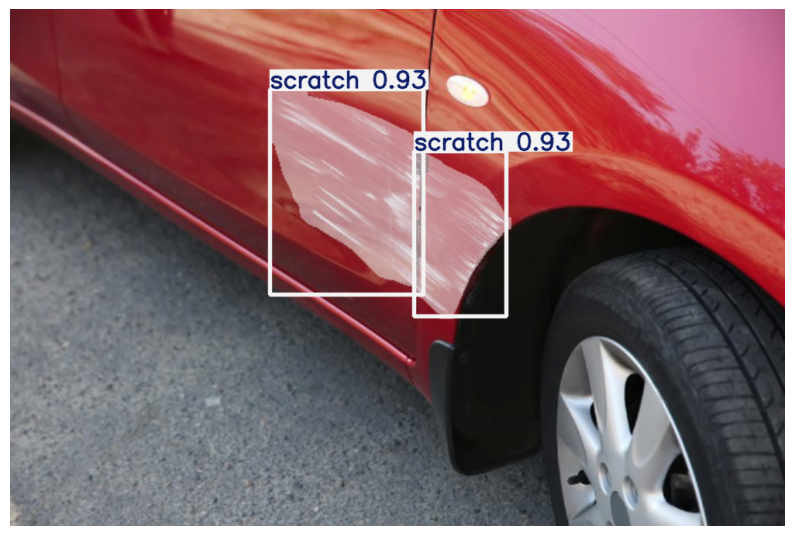

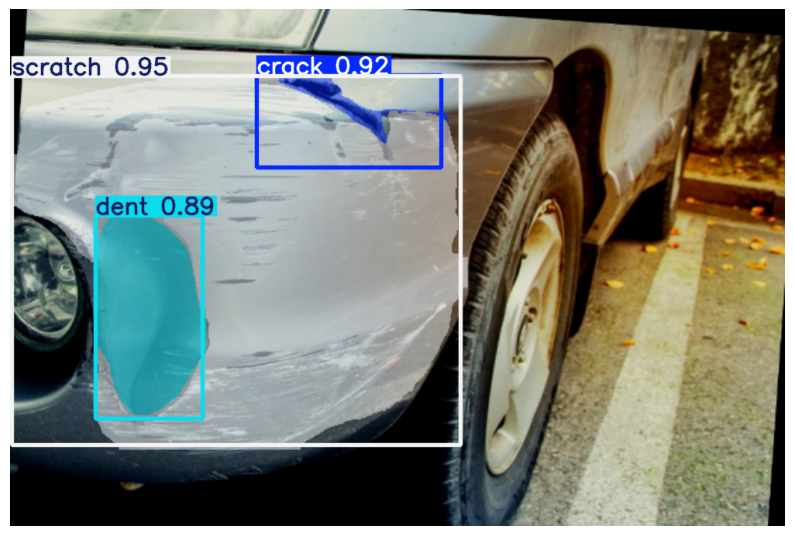

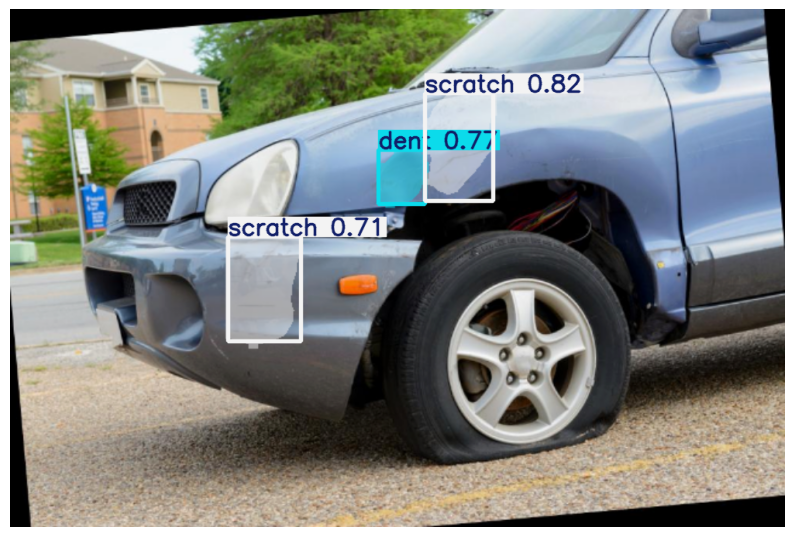

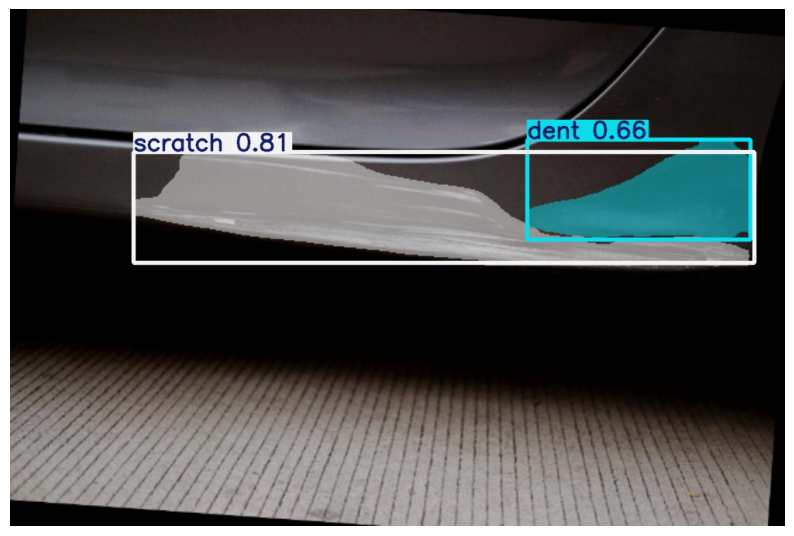

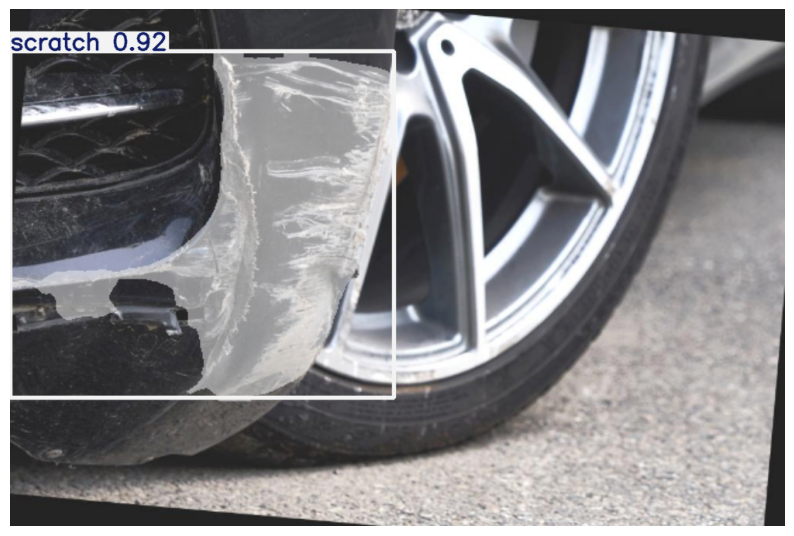

...

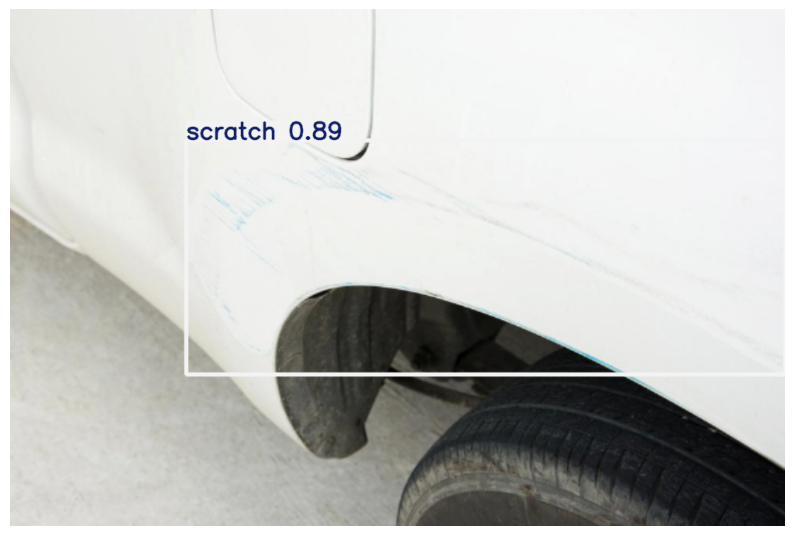

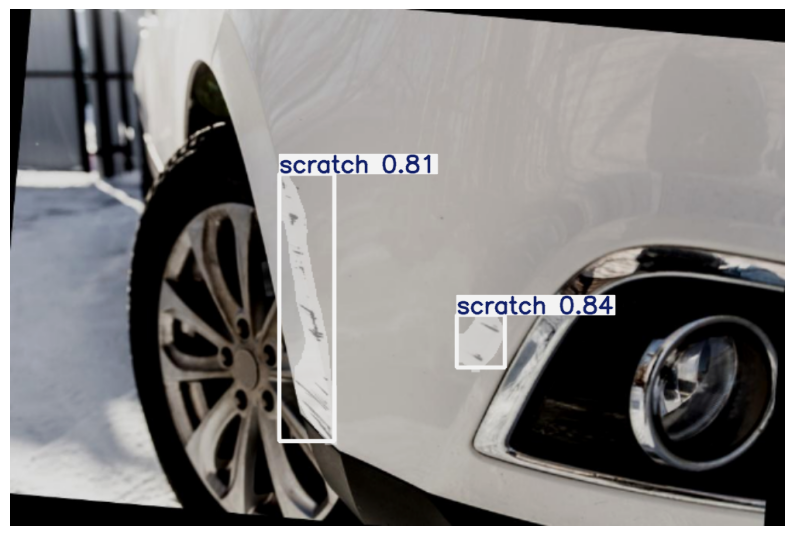

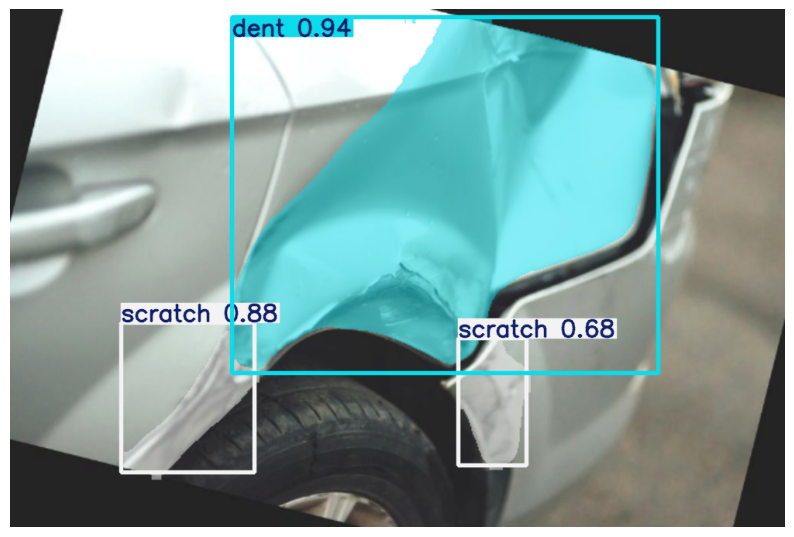

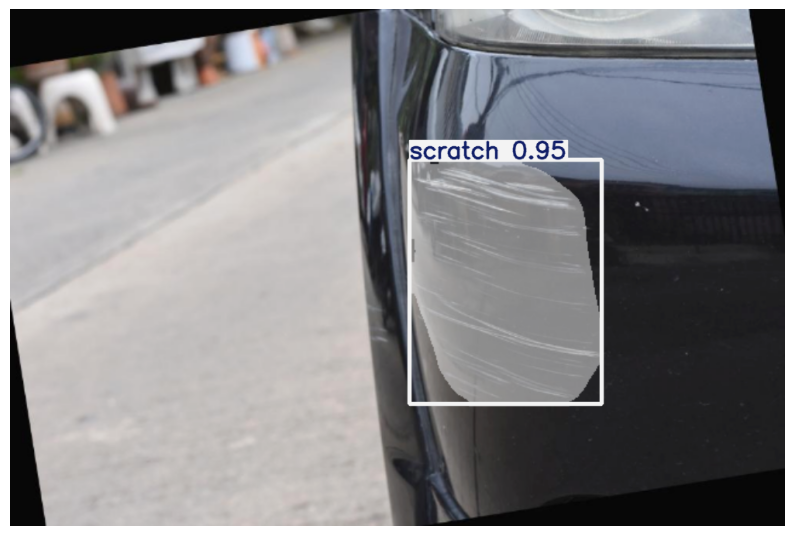

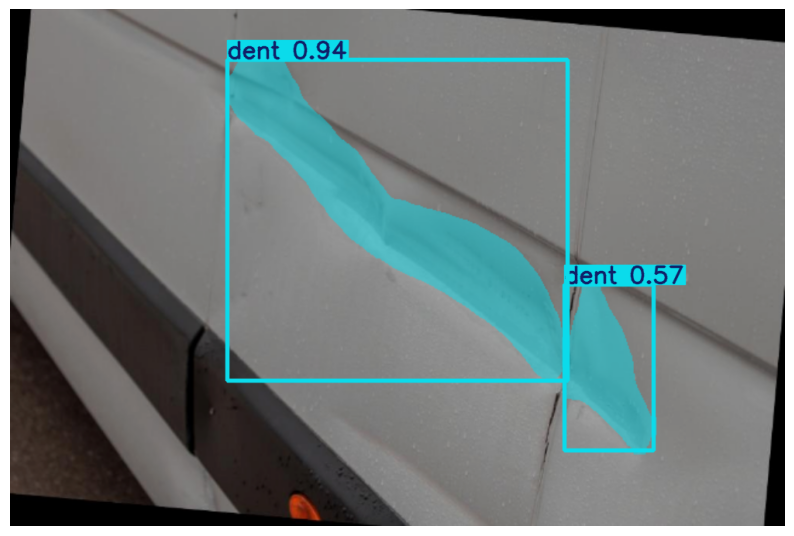

In [13]:
import random
import cv2
import matplotlib.pyplot as plt

model = YOLO('/kaggle/working/DamageDetection-v8/weights/best.pt')
image = '/kaggle/working/dataset/test/images'
image_paths = [os.path.join(image, f) for f in os.listdir(image) if f.endswith(('.jpg', '.png', '.jpeg'))]

imgs = random.sample(image_paths, 20)
results = model.predict(source=imgs, save=True, task="segment", conf=0.4, device='cuda:0')

for result in results:
    img = result.plot()
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [14]:
source_folder = "/kaggle/working/DamageDetection-v8"
output_zip = "/kaggle/working/DamageDetection-v8.zip"

shutil.make_archive(output_zip.replace(".zip", ""), 'zip', source_folder)
print(f"Folder compressed to {output_zip}")

Folder compressed to /kaggle/working/DamageDetection-v8.zip
